In [1]:
import torch
import os
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from diffusion_utils import *
import torch.nn.functional as func
from model import UNETv4, UNETv5
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

# Model and normalization

Loaded in Model


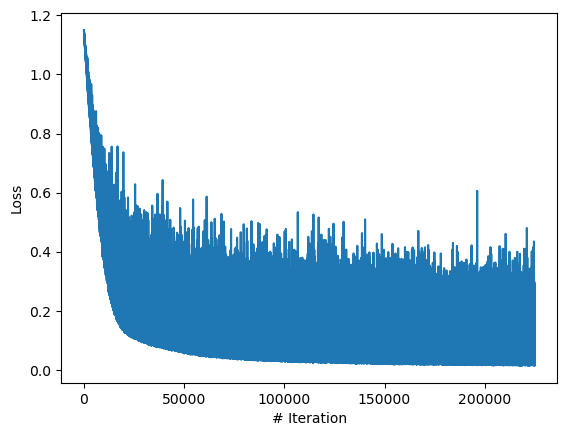

In [7]:
save_dir = r'.\weights'
training_epochs = 180
new_model = UNETv5(in_channels=3, out_channels=1).to(device)
new_model.load_state_dict(torch.load(f"{save_dir}\\model_{training_epochs}.pth", map_location=device))
new_model.eval() 

loss_npy = np.load(f"{save_dir}\\loss_{training_epochs}.npy")
plt.plot(loss_npy)
plt.xlabel('# Iteration')
plt.ylabel('Loss')
# plt.xlim(0,10000)
# plt.ylim(0,1)
print("Loaded in Model")


In [8]:
dataset = CustomDataset(input_folder, output_folder, transform=True)
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
x_sample, y_sample = next(iter(train_loader))
samples_new_10, intermediate_new_10 = sample_ddim(x_sample.to(device), step_size=25, model=new_model, device=device)


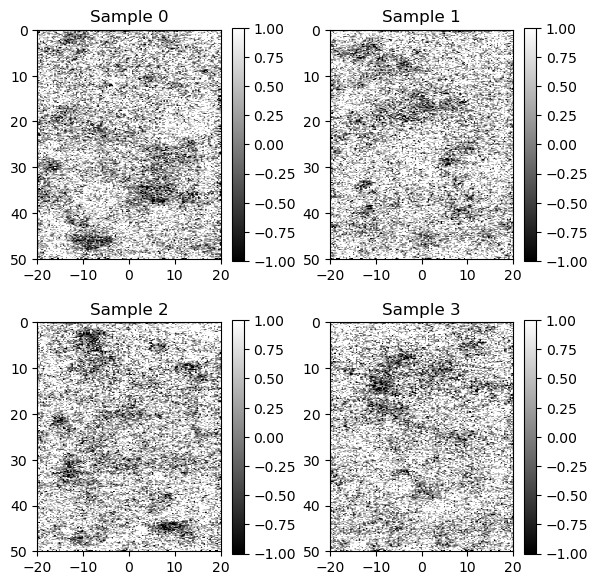

In [9]:
plot_minibatch(samples_new_10.to('cpu'))


# New architecture, linear time schedule

Dataset length: 10000
torch.Size([4, 2, 800, 128])
torch.Size([4, 1, 800, 128])


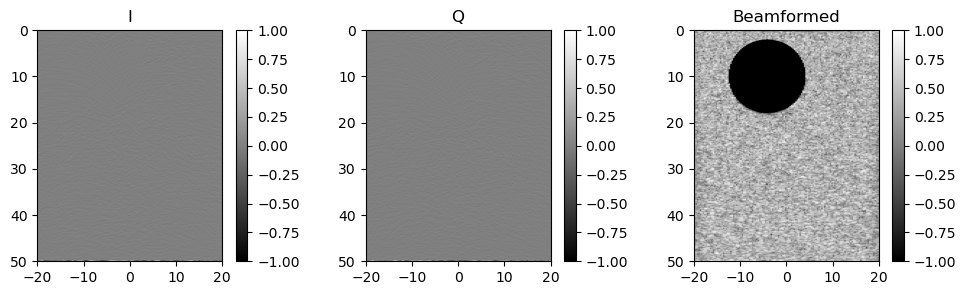

In [3]:
from diffusion_utils import *

# network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
width = 128
height = 800  # 16x16 image
save_dir = r'.\weights_v6'

# training hyperparameters
batch_size = 4

# DDPM noise schedule
time_steps = 100
beta1 = 1e-4*5
beta2 = 0.02*5
ab_t = linear_time_schedule(time_steps,beta1=beta1,beta2=beta2,device=device)

input_folder = r'C:\Users\u_imagenes\Documents\smerino\input'
output_folder = r'C:\Users\u_imagenes\Documents\smerino\target_enh'
dataset = CustomDataset(input_folder, output_folder, transform=True)
print(f'Dataset length: {len(dataset)}')
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
x_sample, y_sample = next(iter(train_loader))
print(x_sample.shape)
print(y_sample.shape)
plot_sample(x_sample[1, :, :, :], y_sample[1, :, :, :])

In [4]:
@torch.no_grad()
def sample_ddim(x, step_size, schedule, model, device):
    """ sample quickly using DDIM """
    # x_T ~ N(0, 1), sample initial noise
    output_shape = list(x.shape)
    output_shape[1] = 1
    output = torch.randn(output_shape).to(device)
    input_model = torch.cat((x, output), 1)

    step_size = int(step_size)
    # array to keep track of generated steps for plotting
    intermediate = []
    for i in range(len(schedule)-1, 0, -step_size):
        print(f'sampling timestep {i:3d}', end='\r')
        # reshape time tensor
        t = torch.tensor([i])[:, None, None, None].to(device)
        eps = model(input_model, t)  # predict noise e_(x_t,t)
        output = denoise_ddim(output, schedule[i], schedule[i - step_size], eps)
        intermediate.append(output.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return output, intermediate

Loaded in Model


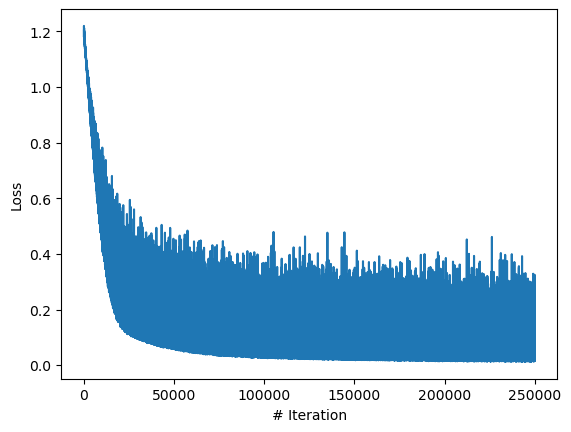

In [19]:
from model2 import UNETv6

# Model and normalization
save_dir = r'.\weights_v6'
training_epochs = 200
model_6 = UNETv6(in_channels=3, out_channels=1).to(device)
model_6.load_state_dict(torch.load(f"{save_dir}\\model_{training_epochs}.pth", map_location=device))
model_6.eval()

loss_npy = np.load(f"{save_dir}\\loss_{training_epochs}.npy")
plt.plot(loss_npy[1:])
plt.xlabel('# Iteration')
plt.ylabel('Loss')
# plt.xlim(0,10000)
# plt.ylim(0,1)
print("Loaded in Model")

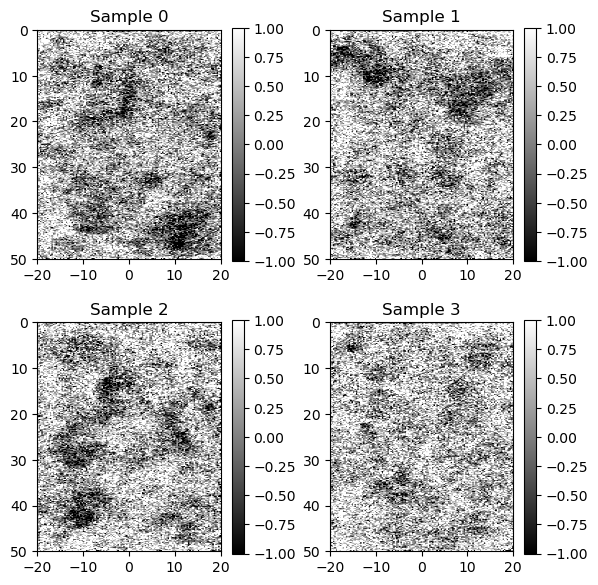

In [20]:
dataset = CustomDataset(input_folder, output_folder, transform=True)
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
x_sample, y_sample = next(iter(train_loader))
# device = 'cpu'
samples_6, intermediate_6 = sample_ddim(x_sample.to(device), step_size=5, model=model_6, device=device, schedule=ab_t)

plot_minibatch(samples_6.to('cpu'))
# animate_reverse_process(intermediate_new_10)

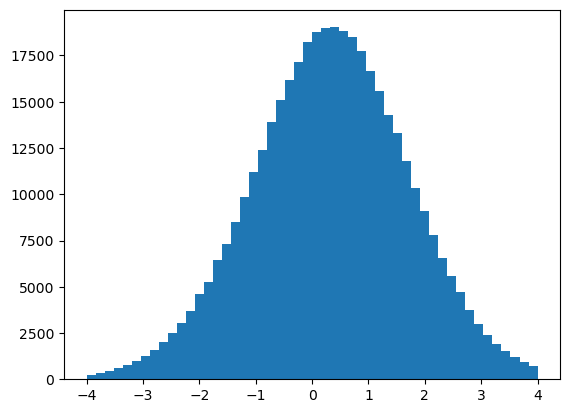

In [28]:
plt.hist(samples_6.cpu().detach().numpy().flatten(),50,(-4,4))
plt.show()

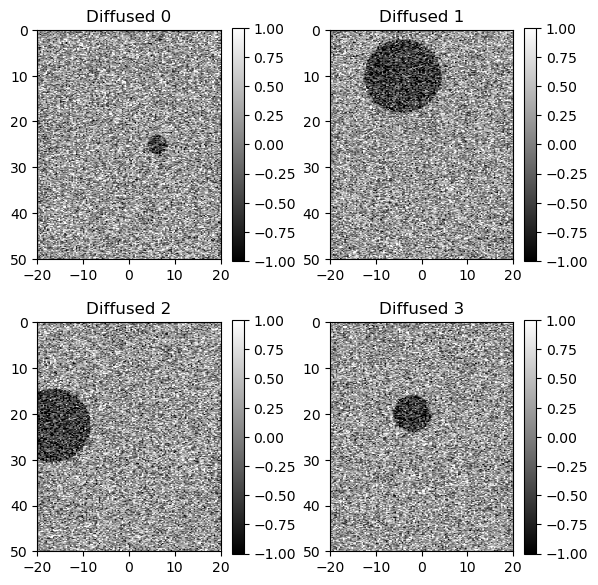

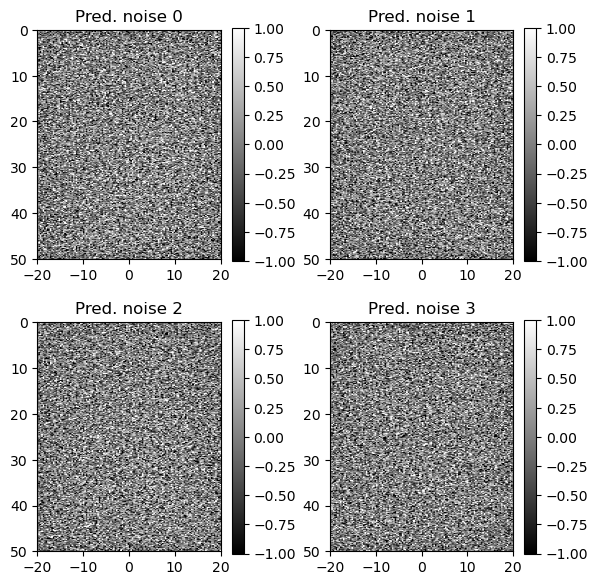

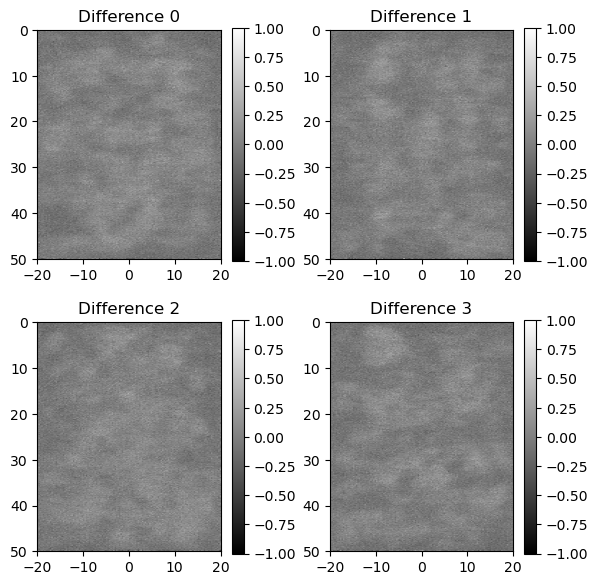

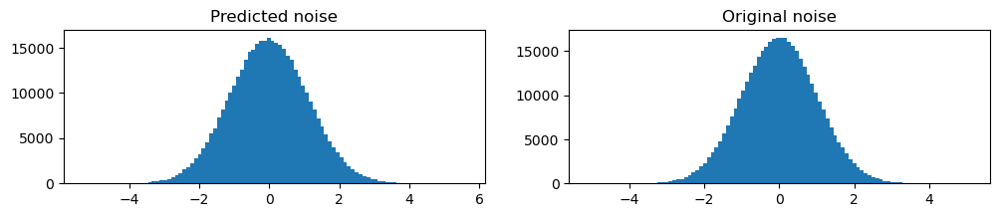

Predicted mean: -0.006589305587112904, std: 1.1076709032058716
Original mean: -0.0006559010362252593, std: 1.000421404838562
MSE: 0.025546906753000975


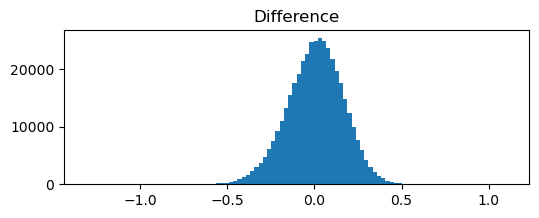

In [29]:
noise_shape = list(x_sample.shape)
noise_shape[1] = 1
noise = torch.randn(noise_shape).to(device)
input_model = torch.cat((x_sample.to(device), noise), 1)

sample_timestep = time_steps * 5 // 10
t = torch.Tensor([sample_timestep]).int().to(device)
y_pert = perturb_input(y_sample.to(device), ab_t[t], noise)

plot_minibatch(y_pert, title="Diffused")
with torch.inference_mode():
    eps = model_6(input_model, t)
    predicted_noise = eps.reshape((height * width * batch_size, 1)).detach().to('cpu').numpy()
    original_noise = noise.reshape((height * width * batch_size, 1)).detach().to('cpu').numpy()

plot_minibatch(eps, title="Pred. noise")
plot_minibatch(eps - noise, title="Difference")
plt.figure(figsize=(12, 2))
plt.subplot(121)
plt.hist(predicted_noise, 100)
plt.title("Predicted noise")

plt.subplot(122)
plt.hist(original_noise, 100)
plt.title("Original noise")
plt.show()

print(f"Predicted mean: {np.mean(predicted_noise)}, std: {np.std(predicted_noise)}")
print(f"Original mean: {np.mean(original_noise)}, std: {np.std(original_noise)}")
print(f"MSE: {np.std(original_noise - predicted_noise) ** 2}")
plt.figure(figsize=(6, 2))
plt.hist(original_noise - predicted_noise, 100)
plt.title("Difference")
plt.show()


# Residual connections, linear time schedule

Loaded in Model


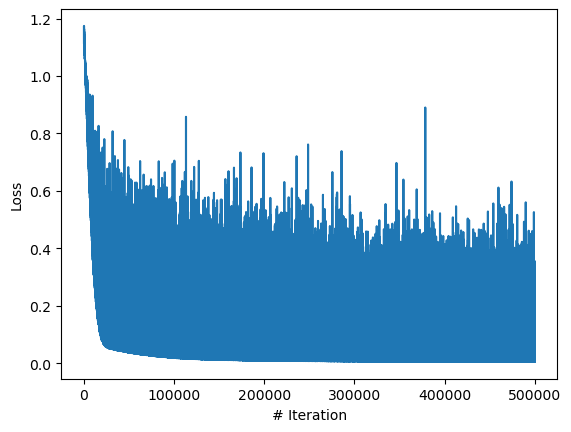

In [30]:
from model2 import UNETv7

# Model and normalization
save_dir = r'.\weights_v7'
training_epochs = 200
model_7 = UNETv7(in_channels=3, out_channels=1).to(device)
model_7.load_state_dict(torch.load(f"{save_dir}\\model_{training_epochs}.pth", map_location=device))
model_7.eval()

loss_npy = np.load(f"{save_dir}\\loss_{training_epochs}.npy")
plt.plot(loss_npy[1:])
plt.xlabel('# Iteration')
plt.ylabel('Loss')
# plt.xlim(0,10000)
# plt.ylim(0,1)
print("Loaded in Model")

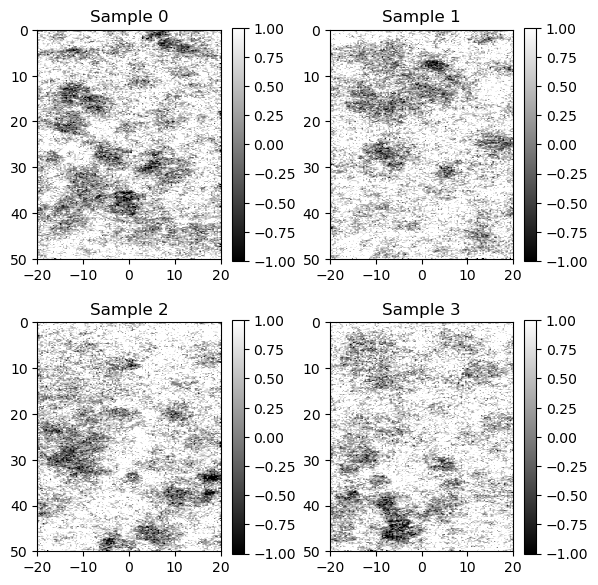

In [36]:
dataset = CustomDataset(input_folder, output_folder, transform=True)
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
x_sample, y_sample = next(iter(train_loader))
# device = 'cpu'
samples_7, intermediate_7 = sample_ddim(x_sample.to(device), step_size=5, model=model_7, device=device,
                                                  schedule=ab_t)

plot_minibatch(samples_7.to('cpu'))

In [37]:
animate_reverse_process(intermediate_7)


Creating animation...


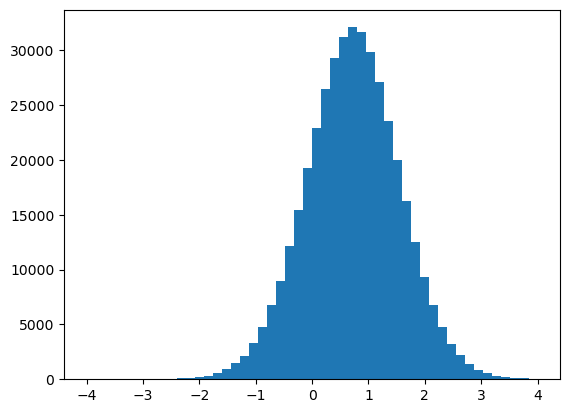

In [35]:
plt.hist(samples_7.cpu().detach().numpy().flatten(), 50, (-4, 4))
plt.show()

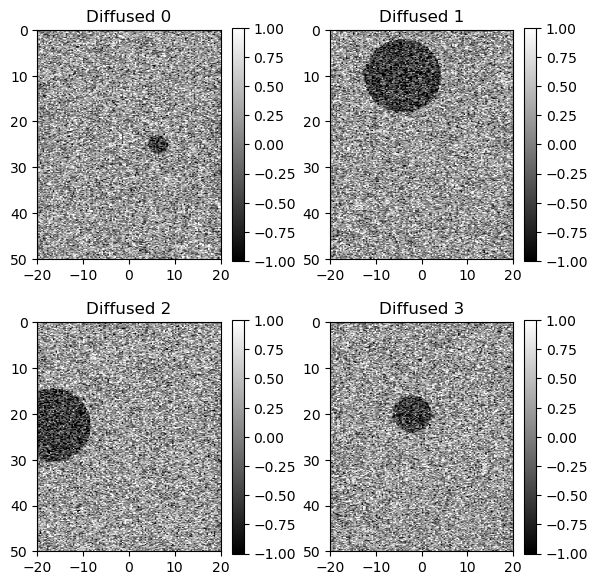

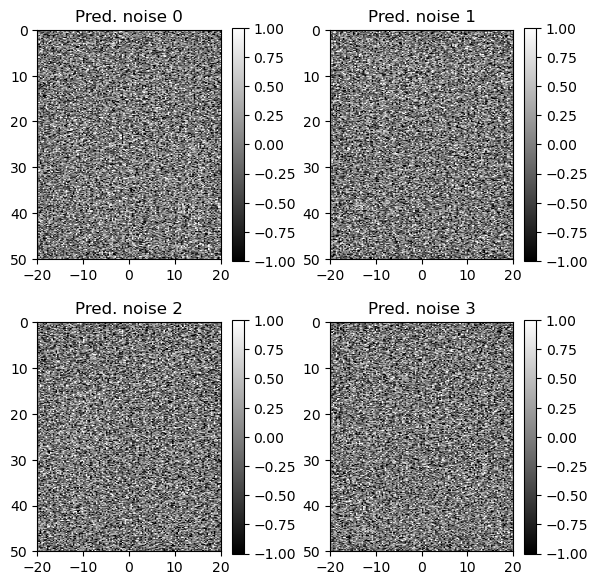

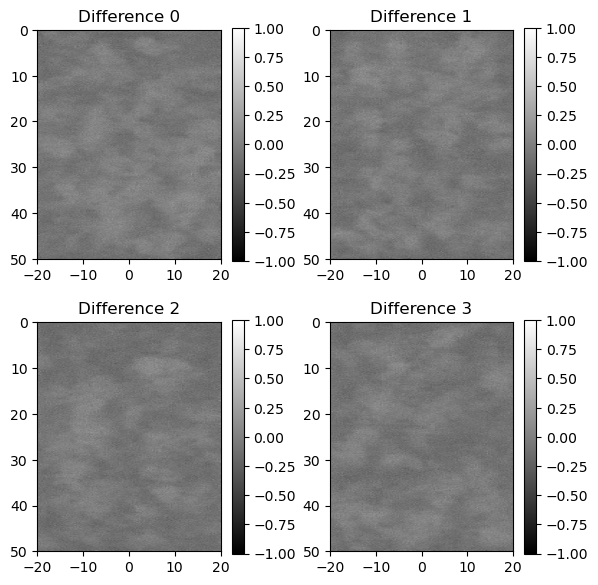

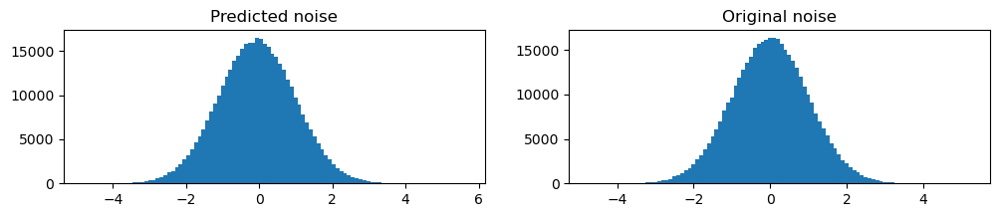

Predicted mean: -0.06612858176231384, std: 1.0469902753829956
Original mean: 1.596238507772796e-05, std: 1.0008659362792969
MSE: 0.008861684627442523


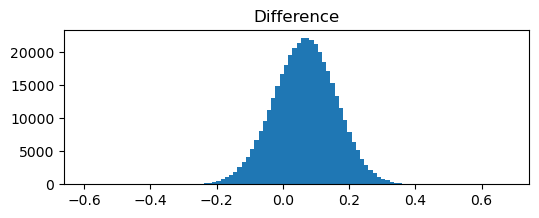

In [33]:
noise_shape = list(x_sample.shape)
noise_shape[1] = 1
noise = torch.randn(noise_shape).to(device)
input_model = torch.cat((x_sample.to(device), noise), 1)

sample_timestep = time_steps * 5 // 10
t = torch.Tensor([sample_timestep]).int().to(device)
y_pert = perturb_input(y_sample.to(device), ab_t[t], noise)

plot_minibatch(y_pert, title="Diffused")
with torch.inference_mode():
    eps = new_model(input_model, t)
    predicted_noise = eps.reshape((height * width * batch_size, 1)).detach().to('cpu').numpy()
    original_noise = noise.reshape((height * width * batch_size, 1)).detach().to('cpu').numpy()

plot_minibatch(eps, title="Pred. noise")
plot_minibatch(eps - noise, title="Difference")
plt.figure(figsize=(12, 2))
plt.subplot(121)
plt.hist(predicted_noise, 100)
plt.title("Predicted noise")

plt.subplot(122)
plt.hist(original_noise, 100)
plt.title("Original noise")
plt.show()

print(f"Predicted mean: {np.mean(predicted_noise)}, std: {np.std(predicted_noise)}")
print(f"Original mean: {np.mean(original_noise)}, std: {np.std(original_noise)}")
print(f"MSE: {np.std(original_noise - predicted_noise) ** 2}")
plt.figure(figsize=(6, 2))
plt.hist(original_noise - predicted_noise, 100)
plt.title("Difference")
plt.show()
